In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import osmnx as ox
from descartes import PolygonPatch
from shapely.geometry import Point, LineString, Polygon, MultiPolygon

In [2]:
yerevan = gpd.read_file("Yerevan shapefile/Yerevan.shp")
yerevan.head()

,place_name,bbox_north,bbox_south,bbox_east,bbox_west,geometry
0,"Yerevan, Armenia",40.26241,40.0656851,44.6460194,44.4115546,"POLYGON ((449912.757 4449454.549, 450854.875 4..."


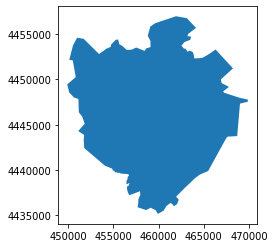

In [3]:
yerevan.plot()

In [4]:
yerevan.crs

{'init': 'epsg:32638'}

+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs


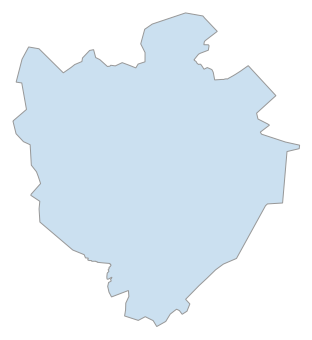

+proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs


In [5]:
# load yerevan city from openstreetmap using osmmnx api
city = ox.gdf_from_place("Yerevan, Armenia")
print(city.crs)
city = ox.project_gdf(city)
fig, ax = ox.plot_shape(city)
print(city.crs)

In [ ]:
city.to_file('Desktop/Yerevan_city.shp')

In [6]:
geometry = city['geometry'].iloc[0]
print(type(geometry))

<class 'shapely.geometry.polygon.Polygon'>


In [7]:
geometry_cut = ox.quadrat_cut_geometry(geometry, quadrat_width = 750)
print(type(geometry_cut))

<class 'shapely.geometry.multipolygon.MultiPolygon'>


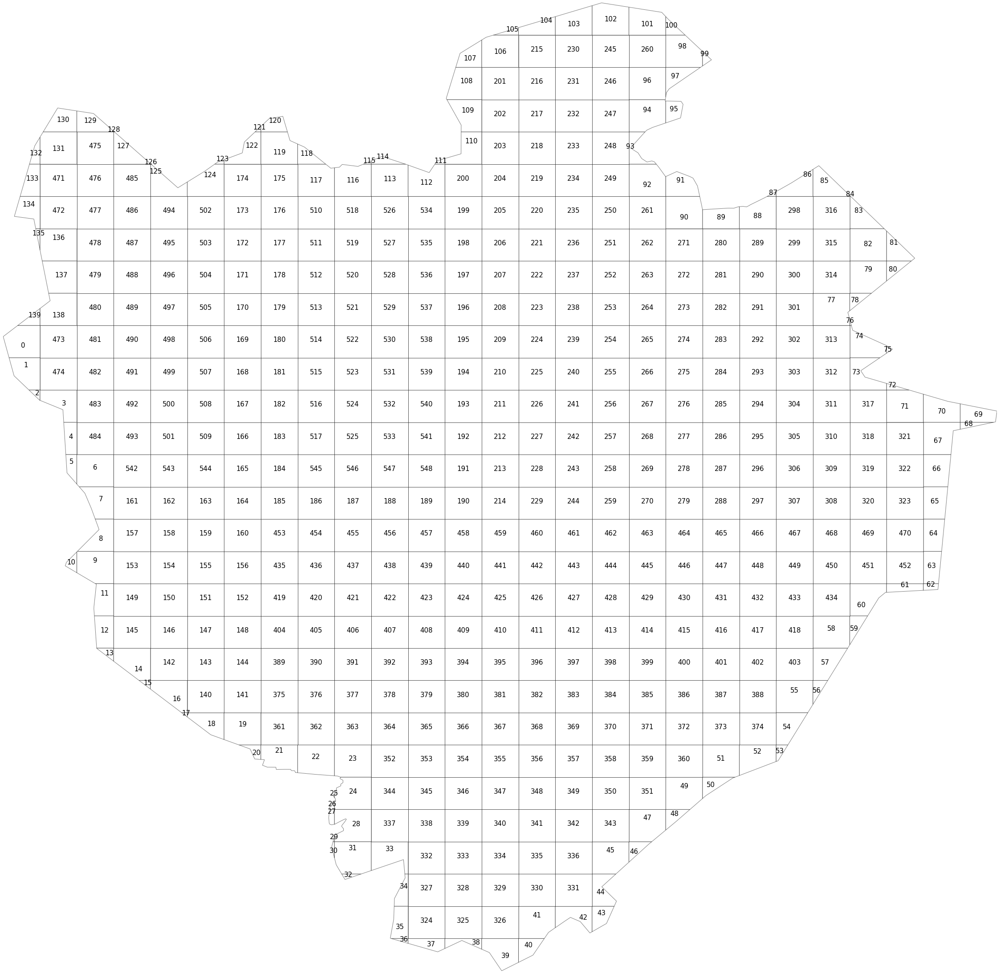

In [8]:
polylist = [p for p in geometry_cut]

# plot city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(s=n, xy=p, horizontalalignment='center', size=15)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [9]:
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city.crs
print(polyframe.crs)
polyframe.head()

+proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs


,geometry
0,"POLYGON ((450030.539 4448976.289, 449912.757 4..."
1,"POLYGON ((450429.797 4448248.773, 450130.662 4..."
2,"POLYGON ((450651.680 4448015.636, 450643.641 4..."
3,"POLYGON ((451127.770 4447521.256, 451111.433 4..."
4,"POLYGON ((451169.681 4446793.739, 451127.770 4..."


In [10]:
len(polyframe)

549

(4875492.0553145055, 4904148.579928727)

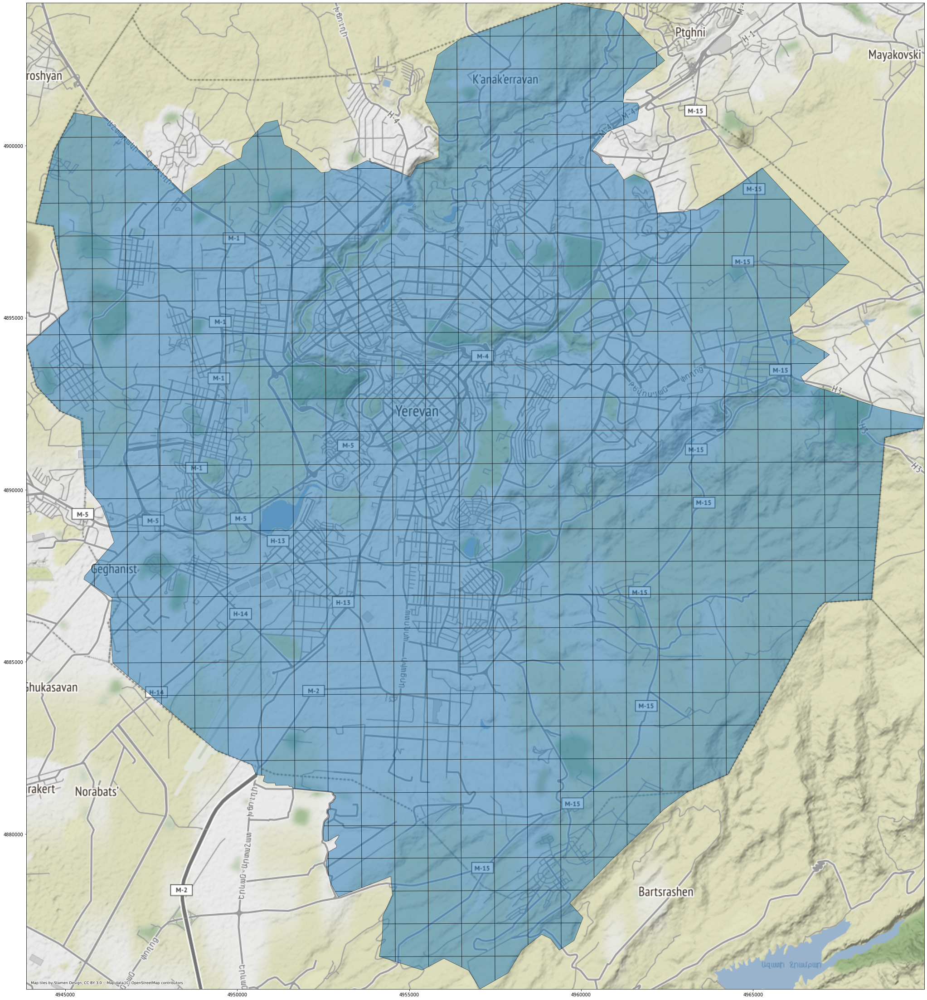

In [11]:
import contextily as ctx
# ctx uses epsg:3857
polyframe_3857 = polyframe.to_crs(epsg=3857)
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)

In [12]:
l = len(polylist)
OD_matrix = np.zeros(shape=(l,l))
print(OD_matrix)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


### Exercise!

Plot the grid cells annotated with their ID numbers with a map background using contextily!

(Try it yourself to test what you've learnt. If you fail or are too lazy for that, the solution is provided at the end of this notebook :) )

In [4]:
import pickle
pkl_file = open("Data/Yerevan_grid_population.pkl", "rb")
yerevan_pop = pickle.load(pkl_file)
pkl_file.close()
print(yerevan_pop)
print(yerevan_pop.shape)

[    0.             0.             0.             0.
     0.             0.             0.             0.
   727.53728629     0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.          3839.78012206
     0.             0.             0.             0.
     0.             0.             0.             0.
  2020.93690635     0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.             0.
     0.             0.             0.          1050.8871913
     0.             0.             0.             0.
     0.             0.         

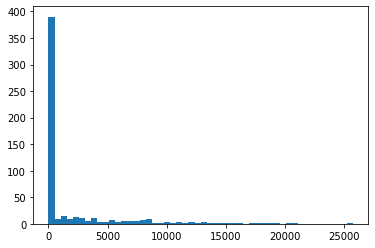

In [14]:
plt.hist(yerevan_pop, bins=50)
plt.show()

In [15]:
yerevan_gdf = gpd.read_file('Yerevan grid shapefile/yerevan.shp')
yerevan_gdf.head()

,FID,geometry
0,0,"POLYGON ((44.41298 40.18969, 44.41155 40.19399..."
1,1,"POLYGON ((44.41772 40.18316, 44.41418 40.18603..."
2,2,"POLYGON ((44.42035 40.18107, 44.42025 40.18110..."
3,3,"POLYGON ((44.42598 40.17664, 44.42576 40.17920..."
4,4,"POLYGON ((44.42652 40.17009, 44.42598 40.17664..."


In [16]:
print('yerevan geodataframe length: ', len(yerevan_gdf))
print('Yerevan population array length: ', len(yerevan_pop))

yerevan geodataframe length:  549
Yerevan population array length:  549


In [17]:
yerevan_gdf['population'] = yerevan_pop
yerevan_gdf.head()

,FID,geometry,population
0,0,"POLYGON ((44.41298 40.18969, 44.41155 40.19399...",0.0
1,1,"POLYGON ((44.41772 40.18316, 44.41418 40.18603...",0.0
2,2,"POLYGON ((44.42035 40.18107, 44.42025 40.18110...",0.0
3,3,"POLYGON ((44.42598 40.17664, 44.42576 40.17920...",0.0
4,4,"POLYGON ((44.42652 40.17009, 44.42598 40.17664...",0.0


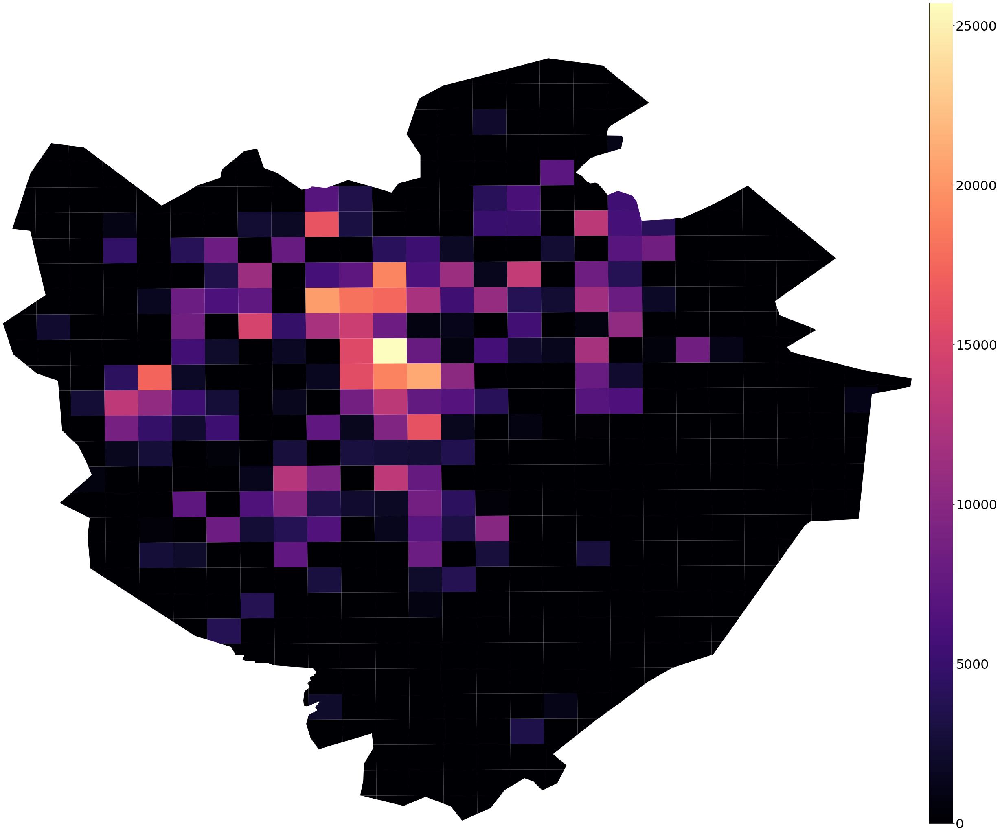

In [18]:
plt.rcParams.update({'font.size':32})
west, south, east, north = yerevan_gdf.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,40))
yerevan_gdf.plot(ax=ax, column = 'population', legend=False, cmap='magma')

cbax = fig.add_axes([0.915, 0.175, 0.02, 0.7])

sm = plt.cm.ScalarMappable(cmap='magma', \
                          norm = plt.Normalize(vmin=min(yerevan_gdf.population), vmax=max(yerevan_gdf.population)))

sm._A = []

# draw colormap into cbax

fig.colorbar(sm, cax=cbax, format="%d")

ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

### Solution to exercise:

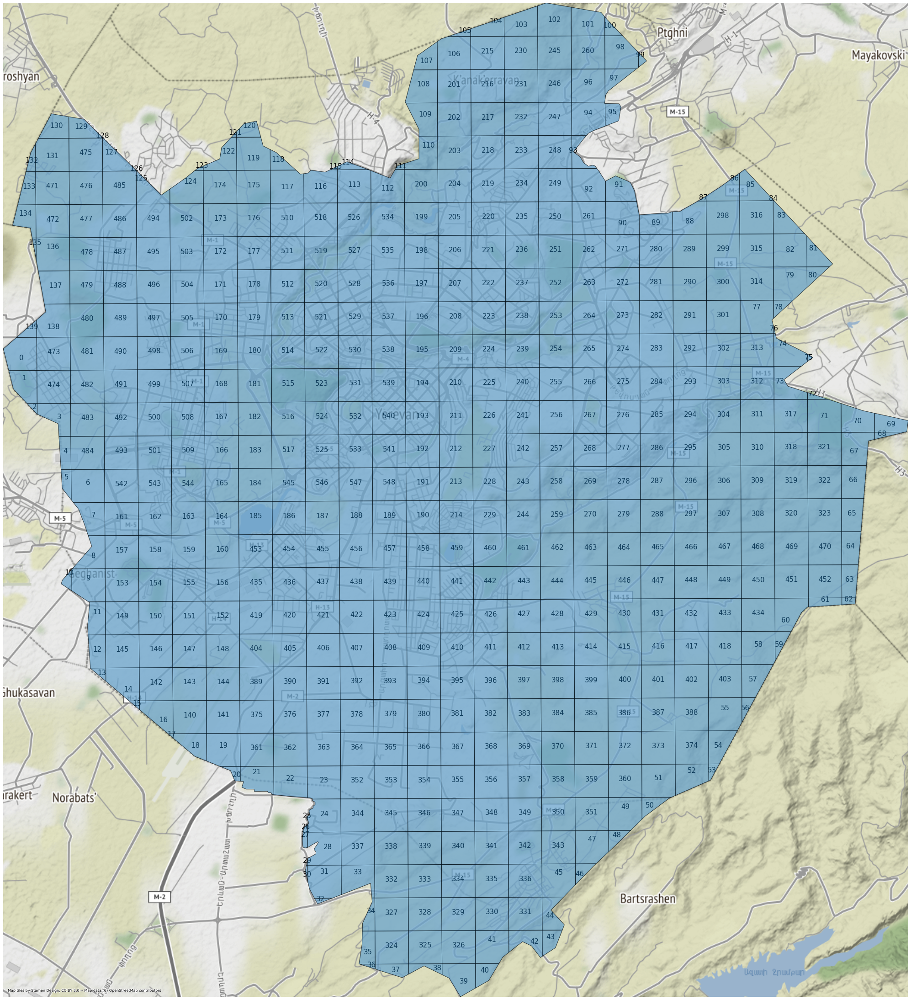

In [19]:
polylist = [p for p in polyframe_3857.geometry]

# plot city
west, south, east, north = polyframe_3857.unary_union.bounds

ax = polyframe_3857.plot(figsize=(40,40), alpha=0.5, edgecolor='k', zorder=5)
for polygon, n in zip(polylist, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(s=n, xy=p, horizontalalignment='center', size=15)
ctx.add_basemap(ax, zoom=13)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()